In [1]:
# Imports
import platform, os, cv2, json, time, pytesseract
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm
from pytesseract import Output
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

# make sure we use the correct path to tesseract when we use windows
if platform.system() == 'Windows':
    pytesseract.pytesseract.tesseract_cmd = 'C:\\Program Files\\Tesseract-OCR\\tesseract.exe'
    
# show all rows in pandas instead of the ... rows
pd.set_option('display.max_rows', None)

%matplotlib inline

In [2]:
# Simply load the PNG images
def load_image(image_path: str) -> np.ndarray:
    """
    Function that loads an image from a path.
    :param image_path: string specifying the path to the image
    :return: Numpy array with the image in BGR format.
    """
    # Checking if it is an image
    if image_path.lower().endswith('.png'):
        # Load the image in BGR format
        image = cv2.imread(image_path)
        return image
    return None

In [3]:
def show_image(image):
    
    # make sure that the figure is big enough to clearly see
    plt.figure(figsize=(20, 20))
    
    # cv2 uses BGR and plt uses RGB, so the color channels need to be converted accordingly
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

In [4]:
# load the test image for the further operations
test_image = os.path.join('..', 'datasets', 'complete', 'Wob-besluit-Project-No-Waste-2021-011855__concatenated-page-006.png')
test_array = load_image(test_image)


# The list of possible documents that might actually get a true positive for the 
# multi-line method out of 768 (manually) reviewed pages (max 10 more that were like these):
# 
# best find so far '20180321_bijlage_1_bij_agenda_stuurgroep_conceptverslag_stuurgroep_13122017-3.png'
# maybe 'documenten-180-226-10.png'
# maybe 'Besluit op Woo-verzoek Schiphol en andere luchtvaartterreinen Nederland-1.png'
# maybe '68.c bericht over afspraak afstemming-2.png'
# maybe '751._FW_Stukken_voor_wethouderoverleg_15_januari-1.png'
# maybe 'Documenten bij Woo-besluit over correspondentie tussen besturen bij totstandkoming rapport Perspectief voor de Gnephoek eo-9.png'
# long shot 'Binder OneLove_page056-001.png'

# load a test image for the multi-line method
multi_test_image = os.path.join('..', 'datasets', 'complete', '20180321_bijlage_1_bij_agenda_stuurgroep_conceptverslag_stuurgroep_13122017-3.png')
multi_test_array = load_image(multi_test_image)

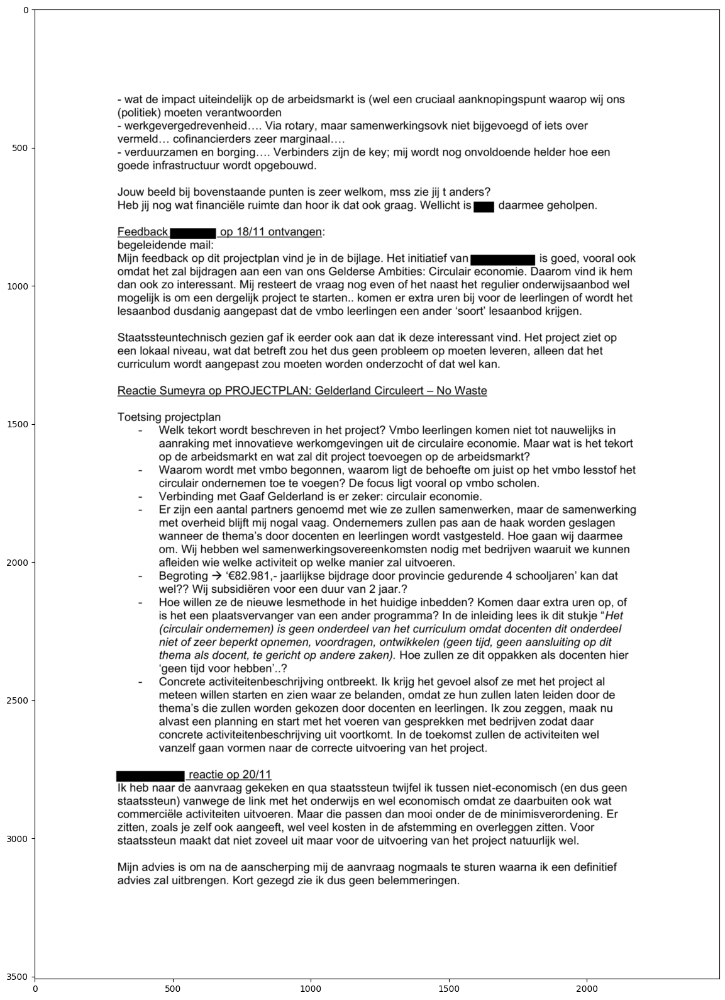

In [5]:
show_image(test_array)

In [6]:
# get the tesseract data in a dict format and put it in a pandas dataframe
tesseract_output = pytesseract.image_to_data(test_image, lang='nld+eng', output_type=Output.DICT)
tesseract_df = pd.DataFrame(tesseract_output)

## Get the double spaces from the tesseract string
This approach doesn't even work slightly for a very simple page. This is enough to write about since it's a lot of extra work to try to get the coordinates of the words around the (false positive) double space.

In [7]:
# get the string representation created by tesseract
# and print it to make sure it got all the words from the document
text = pytesseract.image_to_string(test_array)
text

'- wat de impact uiteindelijk op de arbeidsmarkt is (wel een cruciaal aanknopingspunt waarop wij ons\n(politiek) moeten verantwoorden\n\n- werkgevergedrevenheid.... Via rotary, maar samenwerkingsovk niet bijgevoegd of iets over\nvermeld... cofinancierders zeer marginaal....\n\n- verduurzamen en borging.... Verbinders zijn de key; mij wordt nog onvoldoende helder hoe een\ngoede infrastructuur wordt opgebouwd.\n\nJouw beeld bij bovenstaande punten is zeer welkom, mss ie jij t anders?\nHeb jij nog wat financiéle ruimte dan hoor ik dat ook graag. Wellicht is gj daarmee geholpen.\n\nFeedback SJ Op 18/11 ontvangen:\nbegeleidende mail:\n\nMijn feedback op dit projectplan vind je in de bijlage. Het initiatief van gg is goed, vooral ook\nomdat het zal bijdragen aan een van ons Gelderse Ambities: Circulair economie. Daarom vind ik hem\ndan ook zo interessant. Mij resteert de vraag nog even of het naast het regulier onderwijsaanbod wel\nmogelijk is om een dergelijk project te starten.. komen er e

In [8]:
# get the string representation created by tesseract
text = pytesseract.image_to_string(test_array)

# get the total number of double spaces
double_spaces = 0
start_index = 0
for i in range(len(text)):
    j = text.find('  ', start_index)
    if j != -1:
        start_index = j + 1
        double_spaces += 1
        
# print the occurences 
# I expect either 3 (redactions) or 10 (redactions and tabs for enumeration)
print("Total occurrences are: ", double_spaces)

Total occurrences are:  1


In [9]:
def string_redactions(image):
    
    # get the string representation created by tesseract
    text = pytesseract.image_to_string(image)
    text_without_newlines = text.replace("\n\n", " ").replace("\n", " ")
    words = text_without_newlines.split(' ')
    
    # find all indices of the double spaces
    # remove the last word because that is most likely an empty string
    # that's not really a double space
    indices = [i for i, word in enumerate(words[:-1]) if word == '']
    
    # get the data of the image created by tesseract
    data = pytesseract.image_to_data(test_image, lang='nld+eng', output_type=Output.DICT)
    data_df = pd.DataFrame(data)
    
    # only keep the word blocks and reset the index
    data_df = data_df[data_df['level'] == 5].reset_index(drop=True)
    
    # print the words around the double spaces
    # to see if we actually found our redactions
    for index in indices:
        print(index)
        print(words[index-5:index+5])
    
        # print the data of the words around the index
        # since the index is the only info we have about
        # the double spaces
        print(data_df['text'].iloc[index-5:index+5])

We only managed to find one false positive for this very simple document.
This also shows that the index of the double space can't even be 
reliably used to find the coordinates of the words around it since
the data doesn't find all the words/tokens that the string version does.
Without the coordinates we can't draw the redaction.
There is no need to test this even further.

In [10]:
# test the string redaction
string_redactions(test_array)

297
['vooral', 'op', 'vmbo', 'scholen.', '-', '', 'Verbinding', 'met', 'Gaaf', 'Gelderland']
292        vooral
293            op
294          vmbo
295      scholen.
296    Verbinding
297           met
298          Gaaf
299    Gelderland
300            is
301            er
Name: text, dtype: object


# Calculating spaces between words

In [11]:
def get_spaces_between_words(text_image: np.ndarray, tesseract_confidence: int = 65) -> np.array :
    
    # Get the width and height of the images
    image_height, _ = text_image.shape[:2]

    # Specify the codes we want to detect
    codes = ['5.1.1.', '5.1.2.']

    # run tesseract on the image preprocessed for text
    tesseract_output = pytesseract.image_to_data(text_image, lang='nld+eng', output_type=Output.DICT)
    
    # put the output in a DataFrame 
    tesseract_df = pd.DataFrame(tesseract_output)
    
    # Get the height of the text
    height = np.array(tesseract_output['height'])
    
    # get the median height of the text, we will use this to calculate
    # how much of the page is occupied by words
    median_text_height = np.median(height[height < 0.3*image_height])
    
    # variable to keep track of the previous box
    # that has a word to compare the next box against
    previous_box = None
    
    # array with the spaces
    spaces = []

    # iterate over all rows of the thesseract output
    # NOTE: Any column would've done the job
    number_of_boxes = len(tesseract_output['level'])
    for i in range(number_of_boxes):
        
        # get the box row from the thesseract output
        box = tesseract_df.iloc[i]
        
        # Get the coordinates of the text box if it actually contains any text
        if ((box['text'].strip() != "") and (box['conf'] != -1) and 
            (box['height'] < 0.3*image_height)):
            
            # if we have a previous box, we can calculate the space size
            # also check if the height changes since we can't trust the
            # line_num in some documents
            if not previous_box is None:
                horizontal = box['left'] - (previous_box['left'] + previous_box['width'])
                vertical = box['top'] - previous_box['top']
                
                # NOTE: Include the words for debugging, this can replaced by the box index
                #       once the whole process works
                spaces.append([previous_box['text'], box['text'], horizontal, vertical])

            # set this box as the last box that had a word
            previous_box = box
    
    # return the space sizes (horizontal and vertical)
    return np.array(spaces)

In [12]:
# run the function
spaces = get_spaces_between_words(test_array)

In [13]:
# show the spaces
spaces_df = pd.DataFrame(spaces, columns = ['prev_word', 'word', 'horizontal_diff', 'vertical_diff'])

In [14]:
text = pytesseract.image_to_string(test_array, lang='nld+eng', output_type=Output.DICT)['text']

In [15]:
# median number of pixels between words (the space size)
space_size = spaces_df['horizontal_diff'].median()

## The double space in the string method didn't really work, so let's try to use the coordinates of the words

In [16]:
def median_space_size(text_image: np.ndarray, tesseract_confidence: int = 65) -> float :
    
    # Get the width and height of the images
    image_height, _ = text_image.shape[:2]

    # Specify the codes we want to detect
    codes = ['5.1.1.', '5.1.2.']

    # run tesseract on the image preprocessed for text
    tesseract_output = pytesseract.image_to_data(text_image, lang='nld+eng', output_type=Output.DICT)
    
    # put the output in a DataFrame 
    tesseract_df = pd.DataFrame(tesseract_output)
    
    # Get the height of the text
    height = np.array(tesseract_output['height'])
    
    # get the median height of the text, we will use this to calculate
    # how much of the page is occupied by words
    median_text_height = np.median(height[height < 0.3 * image_height])
    
    # variable to keep track of the previous box
    # that has a word to compare the next box against
    previous_box = None
    
    # array with the spaces
    spaces = []

    # iterate over all rows of the thesseract output
    # NOTE: Any column would've done the job
    number_of_boxes = len(tesseract_output['level'])
    for i in range(number_of_boxes):
        
        # get the box row from the thesseract output
        box = tesseract_df.iloc[i]
        
        # Get the coordinates of the text box if it actually contains any text
        if ((box['text'].strip() != "") and (box['conf'] != -1) and 
            (box['height'] < 0.3*image_height)):
            
            # if we have a previous box, we can calculate the space size
            # also check if the height changes since we can't trust the
            # line_num in some documents
            if not previous_box is None:
                horizontal = box['left'] - (previous_box['left'] + previous_box['width'])
                
                # NOTE: Include the words for debugging, this can replaced by the box index
                #       once the whole process works
                spaces.append(horizontal)

            # set this box as the last box that had a word
            previous_box = box
    
    # return the space sizes (horizontal and vertical)
    return int(np.median(spaces))

In [17]:
# get the median number of pixels between words
average_space_size = median_space_size(test_array)
average_space_size

15

In [18]:
# This function does not work for border redactions
def one_line_redaction_threshold(text_image: np.ndarray, left, right, top, bottom, debug = False, threshold: int = 50) -> bool :
    
    # stop if we don't want to test on the pixel colors
    # and accept this redaction
    if debug: return True
    
    # the initial counts
    total = np.size(text_image[top:bottom, left:right, 0])

    # count the number of non-white and total pixels
    # 225 is an arbitrary number that should make sure that we
    # don't count a slightly gray background as a redaction
    non_white = len([True for row in text_image[top:bottom,left:right] for pixel in row if any(rgb < 225 for rgb in pixel)])
    
    # the ratio of non-white pixels should be higher than the treshold
    return (total and (100 * non_white / total) > threshold)

For the one line redactions we simply calculate the number of pixels between two words that are on the same line and have a high enough confidence score in tesseract. If the confidence is too low, that word will be completely skipped and the next word will be used for the comparison (this might then indicate a redaction).

In [19]:
def one_line_redactions(text_image: np.ndarray, debug: bool = False, tesseract_confidence: int = 65, space_size: int = 15) -> int :
    
    # run tesseract to get the locations of the words
    tesseract_output = pytesseract.image_to_data(text_image, lang='nld+eng', output_type=Output.DICT)
    
    # put the output in a DataFrame 
    tesseract_df = pd.DataFrame(tesseract_output)
    
    # only extract the word block
    word_blocks = tesseract_df[tesseract_df['level'] == 5]
    
    # variable to keep track of the previous block
    # that has a word to compare the next block against
    previous_block = None
    
    # the number of one-line redactions in this document
    redactions = []
    
    # iterate over all rows of the thesseract output
    # NOTE: Any column would've worked for this
    number_of_blocks = len(word_blocks['level'])
    for i in range(number_of_blocks):
        
        # get the block row from the thesseract output
        block = word_blocks.iloc[i]
        
        # ignore the block if the confidence it too low
        # keep the previous block the same
        # and compare it to the next block
        if not block['conf'] > tesseract_confidence:
            continue
            
        # we need to make sure that the word blocks are on the same line
        # and that the confidence is over the threshold
        if ((not previous_block is None) and 
            (previous_block['block_num'] == block['block_num']) and
            (previous_block['par_num'] == block['par_num']) and
            (previous_block['line_num'] == block['line_num'])) :
            
            # calculate the space size between the words
            horizontal = block['left'] - (previous_block['left'] + previous_block['width'])
            
            # if the size is more than twice the sp|ace size, 
            # we probably have some redacted text in this line
            if (horizontal > 2*space_size):
                
                # get the bounderies of the redaction
                # remove the spaces between the words
                # so that we should only keep the redaction
                left = int(previous_block['left'] + previous_block['width'] + space_size)
                right = int(block['left'] - space_size)
                top = min(previous_block['top'], block['top'])
                bottom = max((previous_block['top'] + previous_block['height']), (block['top'] + block['height']))
                    
                # only add the redaction if we're in debug mode
                # or if it passes the threshold of non-white pixels
                if one_line_redaction_threshold(text_image, left, right, top, bottom, debug):
                    redactions.append([[left, top], [right, top], [right, bottom], [left, bottom]])
                    
                    # print the words that the redaction should be in between of
#                     if debug:
#                         print(previous_block['text'], block['text'], horizontal)
                
        # set this block as the last block that had a word
        previous_block = block
        
    # expose the number of one-line redactions
    return np.array(redactions).astype(int)

In [20]:
# print the number of one-line redactions for our test document
# I expect to get the 3 redactions
_ = one_line_redactions(test_array, True, 65, average_space_size)

# Visualize the one-line redactions

In [21]:
def visualize_one_line_redactions(image, tesseract_confidence: int = 65, space_size: int = 15):
    
    # create a copy of the image that we're
    # going to draw the redactions on
    final_image = image.copy()
    
    # function to convert all coordinates to integers
    int_coords = lambda x: np.array(x).round().astype(np.int32)
    
    # find the debug redactions that skip the last check, make these red
    redactions = one_line_redactions(image, True, tesseract_confidence, space_size)
    for redaction in redactions: cv2.polylines(final_image, [int_coords(redaction)], True, color=(0, 0, 255), thickness=5)

    # find the actual redactions that don't skip the last check, make these green
    redactions = one_line_redactions(image, False, tesseract_confidence, space_size)
    for redaction in redactions: cv2.polylines(final_image, [int_coords(redaction)], True, color=(0, 255, 0), thickness=5)

    # show the image
    show_image(final_image)

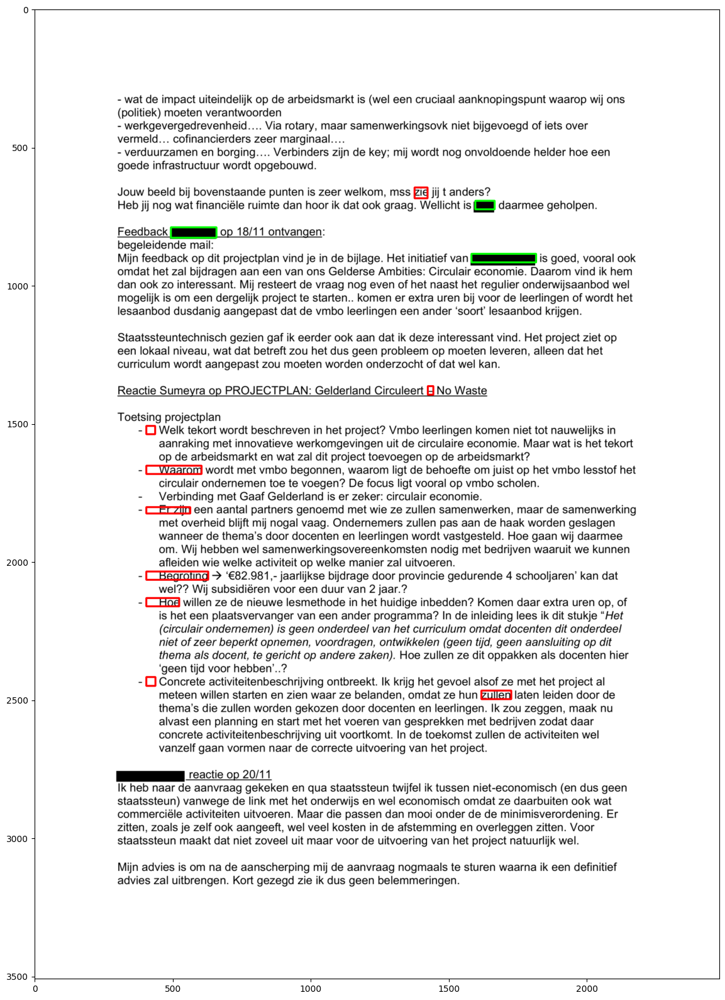

In [22]:
# see how the one-line redaction method
# works on the test image
visualize_one_line_redactions(test_array, 65, average_space_size)

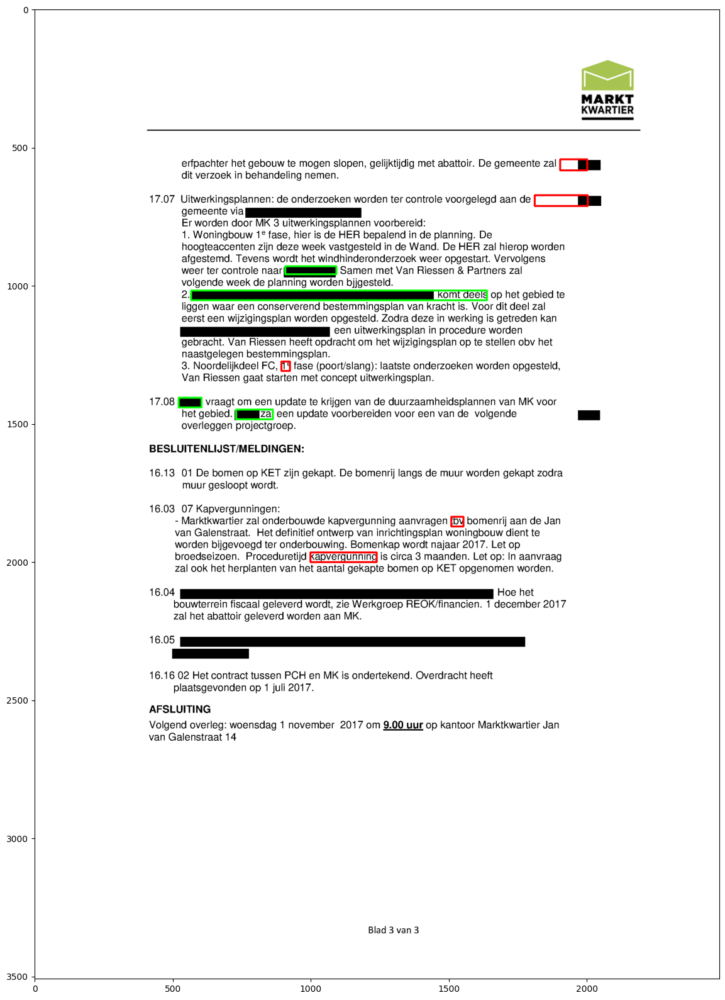

In [23]:
# another test
img_path = os.path.join('..', 'datasets', 'test', '5_20171011_verslag_-_projectgroep_gemeente_fca_17_07_geanonimiseerd-3.png')
img = load_image(img_path)
visualize_one_line_redactions(img, 65, 15)

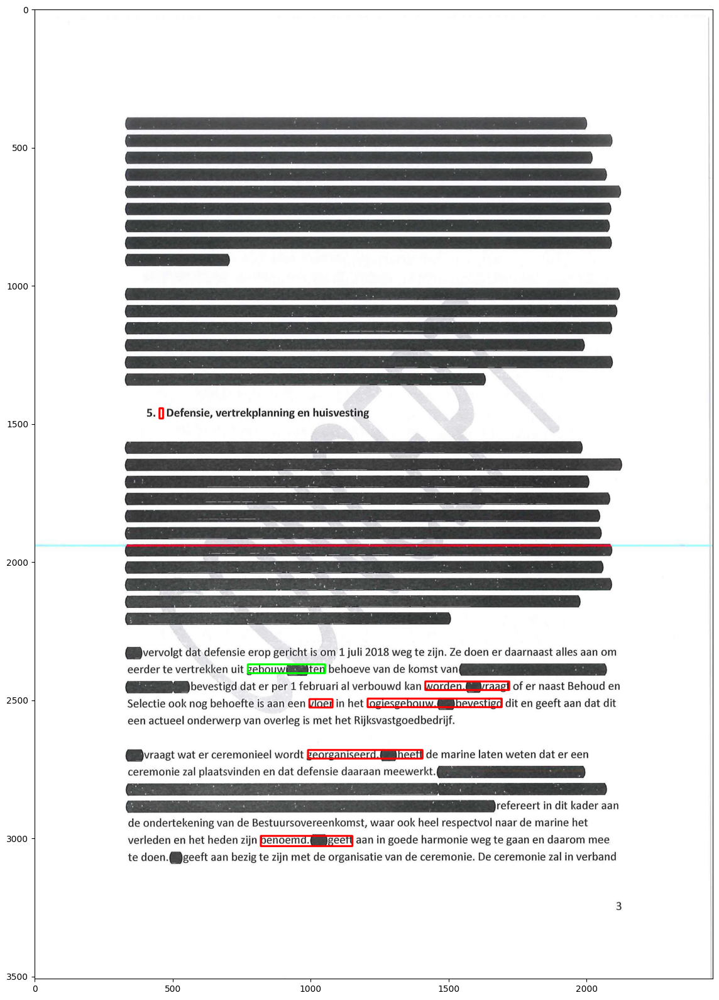

In [24]:
# let's also see how it works for the document
# that we have for the multi-line method
visualize_one_line_redactions(multi_test_array, 65, 15)

Let's try it for more files since it didn't work for `20180321_bijlage_1_bij_agenda_stuurgroep_conceptverslag_stuurgroep_13122017-3.png`

documenten-180-226-10.png


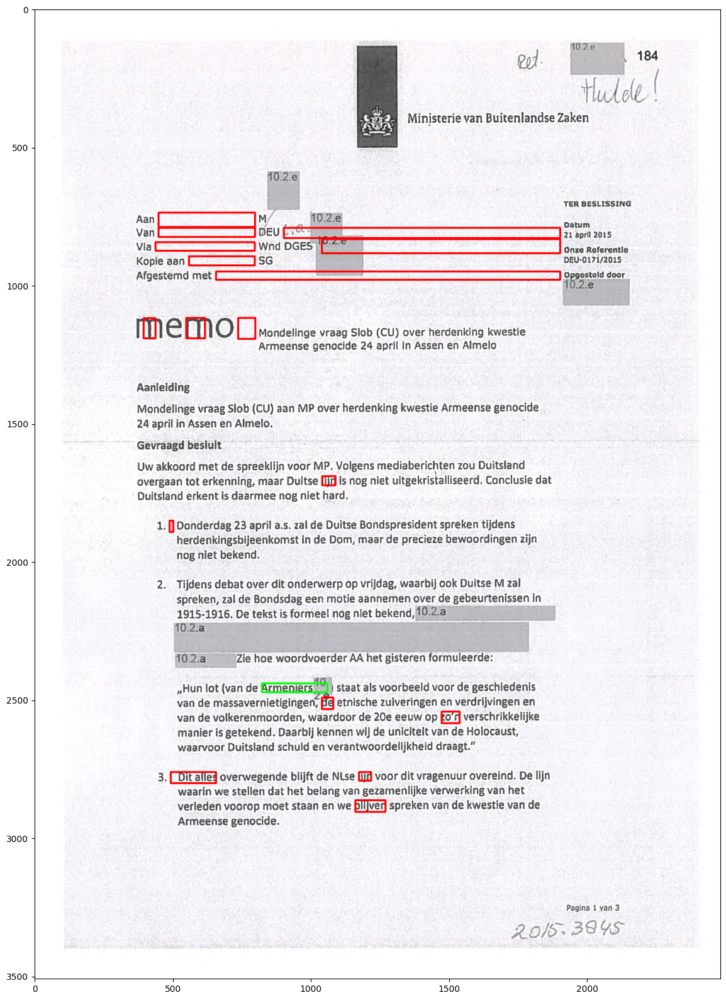

Besluit op Woo-verzoek Schiphol en andere luchtvaartterreinen Nederland-1.png


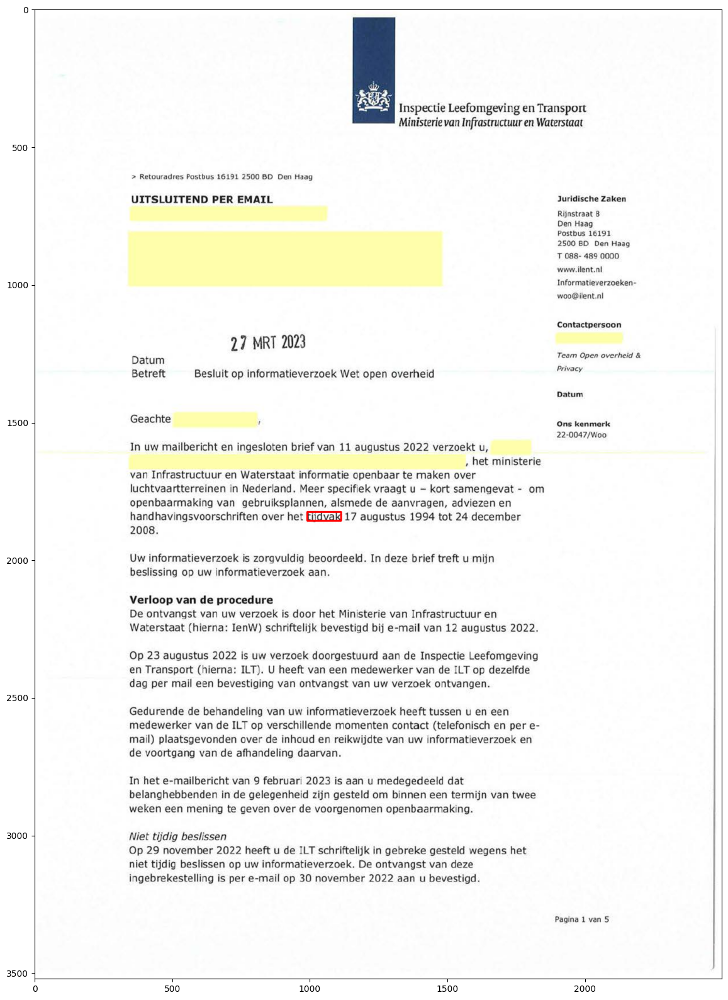

68.c bericht over afspraak afstemming-2.png


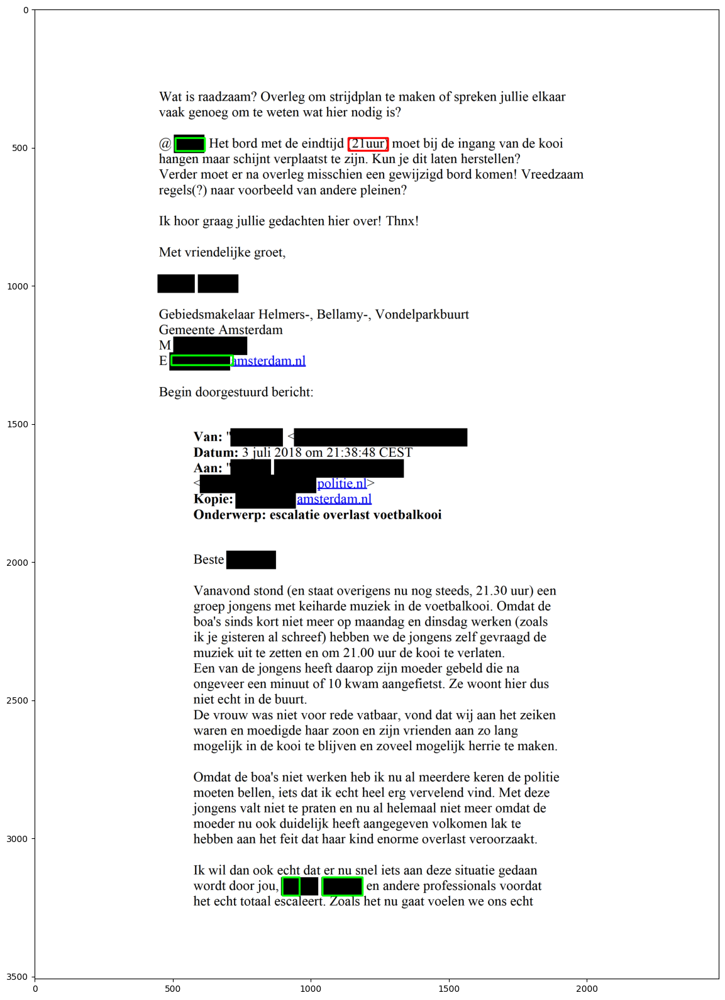

751._FW_Stukken_voor_wethouderoverleg_15_januari-1.png


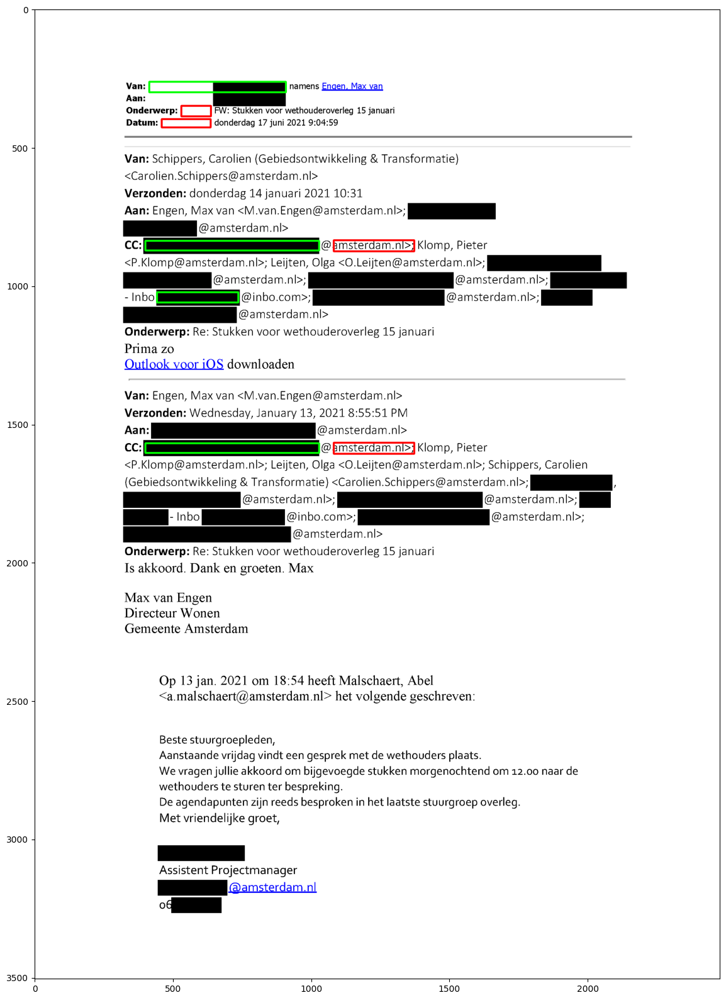

Documenten bij Woo-besluit over correspondentie tussen besturen bij totstandkoming rapport Perspectief voor de Gnephoek eo-9.png


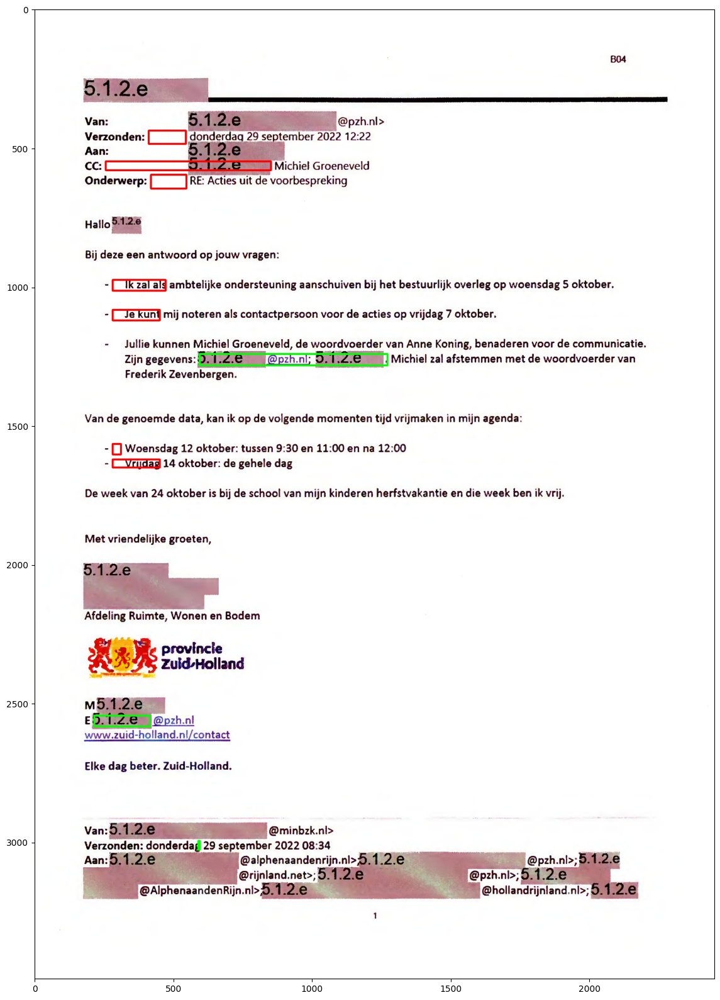

In [25]:
# maybe 'documenten-180-226-10.png'
# maybe 'Besluit op Woo-verzoek Schiphol en andere luchtvaartterreinen Nederland-1.png'
# maybe '68.c bericht over afspraak afstemming-2.png'
# maybe '751._FW_Stukken_voor_wethouderoverleg_15_januari-1.png'
# maybe 'Documenten bij Woo-besluit over correspondentie tussen besturen bij totstandkoming rapport Perspectief voor de Gnephoek eo-9.png'

# the filenames we want to test
filenames = [
    'documenten-180-226-10.png',
    'Besluit op Woo-verzoek Schiphol en andere luchtvaartterreinen Nederland-1.png',
    '68.c bericht over afspraak afstemming-2.png',
    '751._FW_Stukken_voor_wethouderoverleg_15_januari-1.png',
    'Documenten bij Woo-besluit over correspondentie tussen besturen bij totstandkoming rapport Perspectief voor de Gnephoek eo-9.png'
]

# iterate over the files
for filename in filenames:
    
    print(filename)
    # load the file
    img_path = os.path.join('..', 'datasets', 'complete', filename)
    img = load_image(img_path)
    visualize_one_line_redactions(img, 65, 15)

# Analysis of the one-line redactions

`20180321_bijlage_1_bij_agenda_stuurgroep_conceptverslag_stuurgroep_13122017-3.png`

In [26]:
 # run tesseract to get the locations of the words
tesseract_output = pytesseract.image_to_data(multi_test_array, lang='nld+eng', output_type=Output.DICT)

# put the output in a DataFrame 
tesseract_df = pd.DataFrame(tesseract_output)

# only extract the word block
word_blocks = tesseract_df[tesseract_df['level'] == 5]

In [27]:
# It seems like the redactions of this page are seen
# as '@' by tesseract. This is removing the extra space
# that we use to detect the redaction, either by filling the space
# up with the '@' character or by connecting the 2 words next
# to the redaction.
word_blocks[word_blocks['text'].str.contains('@')]

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
44,5,1,8,1,1,1,329,2307,206,45,88,@Bvervolgt
71,5,1,9,1,1,5,769,2368,281,44,31,gebouw@ten
90,5,1,9,1,2,12,1571,2425,136,54,0,@raagt
110,5,1,10,1,1,12,1473,2488,213,52,42,@bevestigd
136,5,1,13,1,1,1,330,2678,177,44,71,@Bvraagt
141,5,1,13,1,1,6,986,2677,420,44,0,georganiseerd.@
192,5,1,15,1,2,6,820,2986,332,44,65,benoemd.@geeft
205,5,1,15,1,3,2,387,3049,240,44,80,doen.@@geeft


`68.c bericht over afspraak afstemming-2.png`

In [28]:
img_path = os.path.join('..', 'datasets', 'complete', '68.c bericht over afspraak afstemming-2.png')
img = load_image(img_path)

# run tesseract to get the locations of the words
tesseract_output = pytesseract.image_to_data(img, lang='nld+eng', output_type=Output.DICT)

# put the output in a DataFrame 
tesseract_df = pd.DataFrame(tesseract_output)

# only extract the word block
word_blocks = tesseract_df[tesseract_df['level'] == 5].reset_index()

In [29]:
# These are all the lines around predicteds redactions, wrong predictions ('(21 uur)')
# and missed predictions. It seems that tesseract detects some bars that are actually 
# redactions, most of them have a low confidence and are removed, but at the end there's
# one that beats the threshold and causes a weird redaction. Besides that tesseract just
# misses words or gives them such a low confidence that they are removed (row 95 below), 
# which causes the method to miss the redaction
word_blocks.iloc[np.r_[21:25, 28:31, 95:98, 108, 109, 307:313]]

,index,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
21,29,5,1,2,1,1,1,452,465,43,47,92,@
22,30,5,1,2,1,1,2,500,449,25,75,43,|
23,31,5,1,2,1,1,3,575,453,40,67,56,|
24,32,5,1,2,1,1,4,631,467,72,34,96,Het
28,36,5,1,2,1,1,8,968,465,153,46,92,eindtijd
29,37,5,1,2,1,1,9,1134,465,146,46,45,(21uur)
30,38,5,1,2,1,1,10,1294,471,101,30,96,moet
95,140,5,1,11,1,1,1,575,1529,102,34,25,Van:
96,141,5,1,11,1,1,2,696,1528,6,14,25,'
97,143,5,1,11,1,2,1,575,1586,160,34,96,Datum:


`751._FW_Stukken_voor_wethouderoverleg_15_januari-1.png`

In [30]:
img_path = os.path.join('..', 'datasets', 'complete', '751._FW_Stukken_voor_wethouderoverleg_15_januari-1.png')
img = load_image(img_path)

# run tesseract to get the locations of the words
tesseract_output = pytesseract.image_to_data(img, lang='nld+eng', output_type=Output.DICT)

# put the output in a DataFrame 
tesseract_df = pd.DataFrame(tesseract_output)

# only extract the word block
word_blocks = tesseract_df[tesseract_df['level'] == 5].reset_index()

In [31]:
# For this document it becomes clear that tesseract has issues
# discerning what the words are. It just detects a lot of random 
# characters with a low confidence and even the '@amsterdam.nl>'
# has such a low confidence that it's not seen as possible word
# by the one-line method.
word_blocks.iloc[np.r_[45, 52:68]]

,index,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
45,67,5,1,4,2,1,4,1082,834,287,39,27,emsterdam.nl>;
52,75,5,1,4,2,2,5,1679,884,374,66,12,is
53,77,5,1,4,2,3,1,320,946,309,67,32,EE
54,78,5,1,4,2,3,2,650,961,24,35,64,©
55,79,5,1,4,2,3,3,690,959,289,39,8,2sterdam.n>;
56,80,5,1,4,2,3,4,1025,950,257,59,13,I
57,81,5,1,4,2,3,5,1523,961,22,35,86,©
58,82,5,1,4,2,3,6,1566,959,288,39,32,emsterdam.n>;
59,83,5,1,4,2,3,7,1901,950,240,59,48,i
60,85,5,1,4,2,4,1,327,1041,11,3,90,-


`Documenten bij Woo-besluit over correspondentie tussen besturen bij totstandkoming rapport Perspectief voor de Gnephoek eo-9.png`


In [32]:
img_path = os.path.join('..', 'datasets', 'complete', 'Documenten bij Woo-besluit over correspondentie tussen besturen bij totstandkoming rapport Perspectief voor de Gnephoek eo-9.png')
img = load_image(img_path)

# run tesseract to get the locations of the words
tesseract_output = pytesseract.image_to_data(img, lang='nld+eng', output_type=Output.DICT)

# put the output in a DataFrame 
tesseract_df = pd.DataFrame(tesseract_output)

# only extract the word block
word_blocks = tesseract_df[tesseract_df['level'] == 5].reset_index()

In [33]:
# In this document tesseract completely fails to detect some words
# at the beginning and end of the document (see rows 0:6 and 170:175
# and the last document in the visualization above). It captures some
# words with a very low confidence cause them to be incorrectly detected
# as a redaction. This happens with 'Ik zal' and 
# the '@pzh.nl' between the redactions.
word_blocks.iloc[np.r_[0:6, 30:34, 74:79, 170:175]]

,index,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,4,5,1,1,1,1,1,552,360,543,59,95,
1,6,5,1,1,1,2,1,552,419,32,30,95,
2,8,5,1,1,1,3,1,548,449,358,81,95,
3,10,5,1,1,1,4,1,548,530,319,65,95,
4,12,5,1,1,1,5,1,552,595,10,37,95,
5,16,5,1,2,1,1,1,182,436,214,48,91,Verzonden:
30,52,5,1,4,1,2,1,254,990,12,5,92,-
31,53,5,1,4,1,2,2,328,974,29,31,0,Ik
32,54,5,1,4,1,2,3,369,974,45,32,0,zal
33,55,5,1,4,1,2,4,428,974,46,32,65,als


# Get the total number of inline redactions with this one-line redaction method and the total number of golden standard redactions

In [34]:
def read_json(file_name):
    with open(file_name, 'r') as json_file:
        return json.load(json_file)

In [35]:
total_redactions = total_gold_standard_redactions = 0

directory = os.path.join('..', 'datasets', 'test')


# Load in the files containing all the gold standard regions 
gold_standard = read_json(os.path.join('..', 'datasets', 'gold_standard_complete.json'))

# iterate over all images in our dataset
for filename in tqdm(os.listdir(directory)):
    
    # load the image
    image_path = os.path.join(directory, filename)
    image = load_image(image_path)
    
    # skip non-images
    if image is None:
        continue
  
    # add the one line redactions of this image to the total count
    total_redactions += len(one_line_redactions(image, False))
                          
    # add the number of regions in the gold standard for this file
    total_gold_standard_redactions += len(gold_standard[filename]['regions'])

# print the total found one-line redactions
print(total_redactions)
print(total_gold_standard_redactions)

# get the ratio of redactions that we were able to find 
# with the assumption that there are no false positives
print(100 * total_redactions / total_gold_standard_redactions)

# The one-line method was only able to find 20% of the redactions, given that we don't have false positives. Let's try a multi-line approach.

In [36]:
def median_boundaries(text_image: np.ndarray, tesseract_confidence: int = 65):
    
    # run tesseract on the image preprocessed for text
    tesseract_output = pytesseract.image_to_data(text_image, lang='nld+eng', output_type=Output.DICT)
    
    # put the output in a DataFrame 
    tesseract_df = pd.DataFrame(tesseract_output)
    
    # only get the word blocks
    tesseract_df = tesseract_df[tesseract_df['level'] == 5]
    
    # the start point is always the first word of a line,
    # we want the median
    start = tesseract_df[tesseract_df['word_num'] == 1]['left'].median()
    
    ends = []
    
    # iterate over all combinations of blocks, paragraphs and lines
    for block in tesseract_df['block_num'].unique().tolist():
        for par in tesseract_df['par_num'].unique().tolist():
            for line in tesseract_df['line_num'].unique().tolist():
                
                # get the words of the current line
                words = tesseract_df[(tesseract_df['block_num'] == block) & 
                                 (tesseract_df['par_num'] == par) &  
                                 (tesseract_df['line_num'] == line)]
                
                # stop if the line is empty 
                # this only happens when the block, par, line 
                # combination doesn't exist
                if words.empty:
                    break
                    
                # get the last word of the line 
                last_word = words.loc[words['word_num'].idxmax()]
                
                # add the right side of the last word to the 
                # list with the last pixel of the lines
                ends.append(last_word['left'] + last_word['width'])
                    
    # return the median start and end pixels
    return int(start), int(np.median(ends))

In [37]:
# get the median start and end pixels of the lines
# we're going to use these to check if we have a
# multi-line redaction or just some white space
boundary_start, boundary_end = median_boundaries(test_array)
print(boundary_start, boundary_end)

304 2062


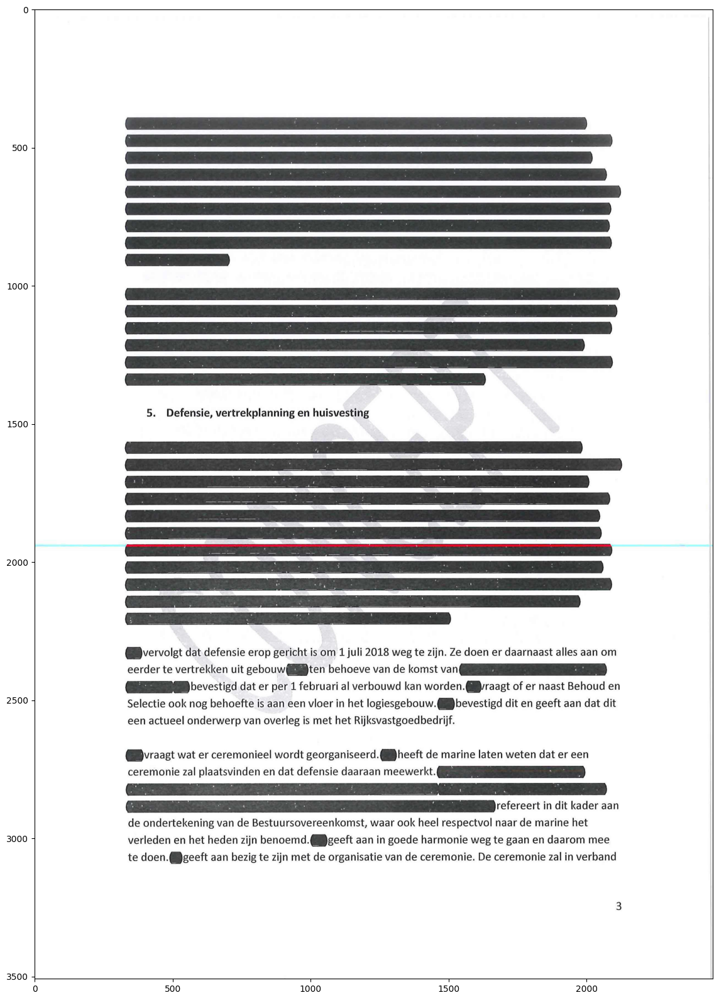

In [38]:
# show this image
show_image(multi_test_array)

In [39]:
from shapely.geometry import Point

def multi_line_redaction_threshold(text_image: np.ndarray, redaction, debug = False, threshold: int = 65) -> bool :
    
    # create a polygon from the redaction
    poly = Polygon(redaction)
    
    # we don't want self-intersecting polygons
    if not poly.is_valid: return False
    
    # stop if we don't want to test on the pixel colors
    # and accept this redaction
    if debug: return True
    
    # get the bounds of the polygon
    # so that we can iterate over them
    minx, miny, maxx, maxy = tuple(map(int, (poly.bounds)))
    
    # get the number of non white pixels
    non_white = len([True for y, row in enumerate(text_image[miny:maxy,minx:maxx]) for x, pixel in enumerate(row) if any(rgb < 225 for rgb in pixel) and poly.contains(Point(x+minx, y+miny))])

    # the ratio of non-white pixels should be higher than the treshold
    return (poly.area and (100 * non_white / poly.area) > threshold)

In [40]:
def multi_line_redactions(text_image: np.ndarray, debug: bool = False, tesseract_confidence: int = 65) -> int :
    
    # run tesseract to get the locations of the words
    tesseract_output = pytesseract.image_to_data(text_image, lang='nld+eng', output_type=Output.DICT)
    
    # put the output in a DataFrame 
    tesseract_df = pd.DataFrame(tesseract_output)
    
    # get the image height
    image_height = text_image.shape[0]
    
    # Get the height of the text
    height = np.array(tesseract_output['height'])
    
    # get the median height of the text, we will use this to calculate
    # how much of the page is occupied by words
    median_text_height = np.median(height[height < 0.3 * image_height])
    
    # get the estimated/average start and end of the lines
    # in the image
    boundary_start, boundary_end = median_boundaries(text_image)
    
    # only extract the word block
    word_blocks = tesseract_df[tesseract_df['level'] == 5]
    
    # variable to keep track of the previous block
    # that has a word to compare the next block against
    previous_block = None
    
    # the initial list of multi-line redactions
    redactions = []
    
     # iterate over all rows of the thesseract output
    # NOTE: Any column would've done the job
    number_of_blocks = len(word_blocks['level'])
    for i in range(number_of_blocks):
        
        # get the block row from the thesseract output
        block = word_blocks.iloc[i]
        
        # ignore the block if the confidence it too low
        # keep the previous block the same
        # and compare it to the next block
        if not block['conf'] > tesseract_confidence:
            continue
            
        # we need to make sure that the word blocks are on the same line
        # and that the confidence is over the threshold
        if (not previous_block is None) :
            
            # calculate the space size between the words
            # the top metric increases as we get further down the 
            # document, so we substract the previous block from the current one
            # if we get a negative value, we can ignore it
            vertical = block['top'] - previous_block['top']
            
            # the vertical distance has to be bigger than the text
            if vertical > median_text_height and previous_block['text'] and block['text']:
                
                # the points of the first line
                first_top = int(previous_block['top'])
                first_bottom = int(previous_block['top'] + previous_block['height'])
                first_left = int(previous_block['left'] + previous_block['width'])
                first_right = int(boundary_end)
                
                # points of the last line
                last_top = int(block['top'])
                last_bottom = int(block['top'] + block['height'])
                last_left = int(boundary_start)
                last_right = int(block['left'])  
                
                # create the redaction
                redaction = [[first_left, first_top], [first_right, first_top], 
                                   [first_right, last_top], [last_right, last_top], 
                                   [last_right, last_bottom], [last_left, last_bottom], 
                                   [last_left, first_bottom], [first_left, first_bottom]]
                
                # only add the redaction if we're in debug mode
                # or if it passes the threshold of non-white pixels
                if multi_line_redaction_threshold(text_image, redaction, debug): 
                    redactions.append(redaction)
                
#                     if debug:
#                         print(previous_block['text'], block['text'], vertical)

        # set this block as the last block that had a word
        previous_block = block
        
    # expose the number of one-line redactions
    return np.array(redactions).astype(int)

In [41]:
# test the function it doens't really find the correct 
_ = multi_line_redactions(multi_test_array, False)

In [42]:
def visualize_multi_line_redactions(image, tesseract_confidence: int = 65):
   
    # create a copy of the image that we're
    # going to draw the redactions on
    final_image = image.copy()
    
    # function to convert all coordinates to integers
    int_coords = lambda x: np.array(x).round().astype(np.int32)
        
    # find the debug redactions that skip the last check, make these red
    redactions = multi_line_redactions(image, True, tesseract_confidence)
    for redaction in redactions: cv2.polylines(final_image, [int_coords(redaction)], True, color=(0, 0, 255), thickness=5)

    # find the actual redactions that don't skip the last check, make these green
    redactions = multi_line_redactions(image, False, tesseract_confidence)
    for redaction in redactions: cv2.polylines(final_image, [int_coords(redaction)], True, color=(0, 255, 0), thickness=5)

    # show the image
    show_image(final_image)

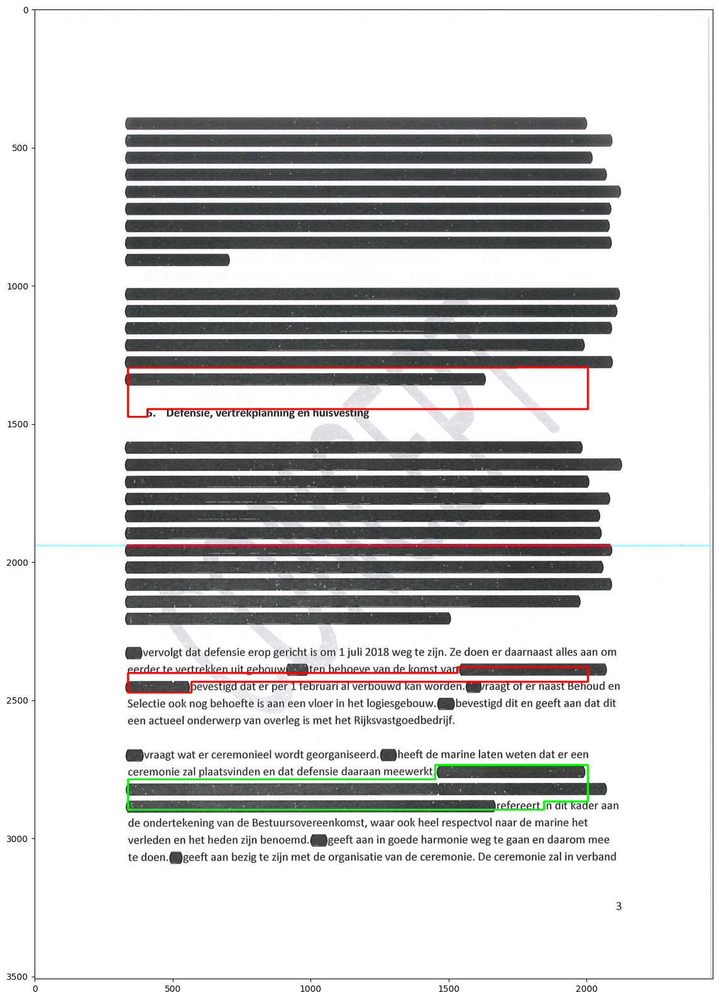

In [43]:
visualize_multi_line_redactions(multi_test_array)

# @todo add analysis of the multi-line method

# Evaluation of the baseline

In [44]:
page_csv = pd.read_csv(os.path.join('..', 'datasets', 'data_complete.csv')).set_index('File')
test_dir = os.path.join('..', 'datasets', 'test')
gold_standard = read_json(os.path.join('..', 'datasets', 'gold_standard_complete.json'))

In [45]:
# rewrite this to just work with only the output polygons
def evaluate_detection(input_image_filename, debug: bool = False):
    gold_standard_contours = gold_standard[os.path.split(input_image_filename)[-1]]
    
    # load the image and get the predicted redactions
    img = load_image(input_image_filename)
    
    one_line_contours = one_line_redactions(img, debug, 65, 15)
    multi_line_contours = multi_line_redactions(img, debug, 65)
    
    # Get the attributes of all the boxes in the gold standard annotation
    polygons = [r['shape_attributes'] for r in gold_standard_contours['regions']]

    # set the total sum of the IOU
    sum_IoU = 0
    TP = []
    FN = []
    FP = []

    one_line_polygons = [Polygon(np.squeeze(contour)) for contour in one_line_contours]
    multi_line_polygons = [Polygon(np.squeeze(contour)) for contour in multi_line_contours]
    
    predicted_polygons = one_line_polygons + multi_line_polygons
    
    ground_truth_polygons = []
    
    for polygon in polygons:
        if polygon['name'] == 'rect':
            bottom_left = [polygon['x'], polygon['y']]
            bottom_right = [polygon['x']+polygon['width'], polygon['y']]
            top_right = [polygon['x']+polygon['width'], polygon['y']+polygon['height']]
            top_left = [polygon['x'], polygon['y']+polygon['height']]
            
            gold_standard_polygon_xy = [bottom_left, bottom_right, top_right, top_left]
        else:
            # If not a rectangle we have a more complex shape and we just add all points to it
            gold_standard_polygon_xy  = [[polygon['all_points_x'][i], polygon['all_points_y'][i]] for i in range(0, len(polygon['all_points_x']))]

        ground_truth_polygons.append(Polygon(gold_standard_polygon_xy))
        
    # Loop over all of the predicted and ground truth polygons and check if there
    # is enough overlap to be a True Positive
    for predicted_polygon in predicted_polygons:
        for ground_truth_polygon in ground_truth_polygons:
            
            # make sure that the polygone is not self-intersecting
            if not ground_truth_polygon.is_valid:
                ground_truth_polygon = ground_truth_polygon.buffer(0)
                
            polygon_intersection = predicted_polygon.intersection(ground_truth_polygon).area
            polygon_union = predicted_polygon.area + ground_truth_polygon.area - polygon_intersection
        
            if (polygon_intersection / polygon_union) >= 0.5:
                sum_IoU += (polygon_intersection / polygon_union)
                TP.append([ground_truth_polygon, predicted_polygon])

    # Calculate false positives, false negatives and true positives and the PQ
    # score.
    FP = [polygon for polygon in predicted_polygons if polygon not in [item[1] for item in TP]]
    FN = [polygon for polygon in ground_truth_polygons if polygon not in [item[0] for item in TP]]
    
    return {'TP': len(TP), 'FP': len(FP), 'FN': len(FN), 'IOU': sum_IoU}

In [46]:
def evaluate_dataframe(images_dir, debug: bool = False):
    all_scores = {}
    for filename in tqdm(os.listdir(images_dir)):
        path = os.path.join(images_dir, filename)
        image_scores = evaluate_detection(path, debug)
        all_scores[filename] = image_scores
    return all_scores

In [47]:
all_scores = evaluate_dataframe(test_dir)

 47%|████▋     | 133/284 [34:46<46:17, 18.39s/it]  C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 284/284 [1:26:04<00:00, 18.18s/it]


In [48]:
results = pd.DataFrame(all_scores).T
#add the scores and statistic to the dataframe
complete_dataframe = page_csv.join(results, how='right')

In [49]:
# save the dataframe
complete_dataframe.to_csv(os.path.join('results', 'baseline_results.csv'))

In [50]:
def metric_calculation(dataframe):
    # We calculate the metrics over the total of each class, basically viewing the 
    # complete class as one big image.
    
    SQ = dataframe['IOU'].sum() / dataframe['TP'].sum()
    RQ = dataframe['TP'].sum() / (dataframe['TP'].sum() + 0.5*dataframe['FN'].sum() + 0.5*dataframe['FP'].sum())
    PQ = SQ*RQ
    P = dataframe['TP'].sum() / (dataframe['TP'].sum() + dataframe['FP'].sum())
    R = dataframe['TP'].sum() / (dataframe['TP'].sum() + dataframe['FN'].sum())
    
    number_of_segments =  dataframe['TP'] + dataframe['FN']
    dataframe['num_segments'] = number_of_segments
    return round(SQ, 2), round(RQ, 2) , round(PQ, 2), round(P, 2), round(R, 2), dataframe

In [51]:
# Make the results table, where we group based on redaction type.
type_results_table = {}
for label, df in complete_dataframe.groupby('type'):
    
    # skip the 'no_annotations' type
    if label == 'no_annotation': continue
        
    SQ, RQ, PQ, P, R, dataframe = metric_calculation(df)
    redacted_type = df['type'].tolist()[0]
    type_results_table[redacted_type] = {'PQ': PQ, 'SQ': SQ, 'RQ': RQ, 'P': P, 'R': R}

SQ, RQ, PQ, P, R, dataframe = metric_calculation(complete_dataframe)
type_results_table['total'] = {'PQ': PQ, 'SQ': SQ, 'RQ': RQ, 'P': P, 'R': R}

pd.DataFrame(type_results_table).T

C:\Users\kdmei\AppData\Local\Temp\ipykernel_6276\2012913746.py:5: RuntimeWarning: invalid value encountered in scalar divide
  SQ = dataframe['IOU'].sum() / dataframe['TP'].sum()


,PQ,SQ,RQ,P,R
black,0.10,0.66,0.16,0.46,0.10
border,NaN,NaN,0.00,0.00,0.00
color,0.21,0.69,0.30,0.68,0.19
gray,0.05,0.66,0.07,0.12,0.05
total,0.08,0.67,0.12,0.32,0.08


# Evaluation on the extended test set

In [52]:
page_csv = pd.read_csv(os.path.join('..', 'datasets', 'data_complete.csv')).set_index('File')
test_extended_dir = os.path.join('..', 'datasets', 'test_extended')

In [53]:
all_scores_extended = evaluate_dataframe(test_extended_dir)

 40%|████      | 177/439 [56:42<1:15:02, 17.19s/it] C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
 62%|██████▏   | 274/439 [1:37:22<1:16:12, 27.71s/it]C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
 70%|██████▉   | 306/439 [1:48:19<24:30, 11.06s/it]  C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _

In [54]:
results_extended = pd.DataFrame(all_scores_extended).T
#add the scores and statistic to the dataframe
complete_dataframe_extended = page_csv.join(results_extended, how='right')

In [55]:
# save the dataframe
complete_dataframe_extended.to_csv(os.path.join('results', 'baseline_extended_results.csv'))

In [56]:
# Make the results table, where we group based on redaction type.
type_results_table = {}
for label, df in complete_dataframe_extended.groupby('type'):
    
    # skip the 'no_annotations' type
    if label == 'no_annotation': continue
        
    SQ, RQ, PQ, P, R, _ = metric_calculation(df)
    redacted_type = df['type'].tolist()[0]
    type_results_table[redacted_type] = {'PQ': PQ, 'SQ': SQ, 'RQ': RQ, 'P': P, 'R': R}

SQ, RQ, PQ, P, R, _ = metric_calculation(complete_dataframe_extended)
type_results_table['total'] = {'PQ': PQ, 'SQ': SQ, 'RQ': RQ, 'P': P, 'R': R}

pd.DataFrame(type_results_table).T

C:\Users\kdmei\AppData\Local\Temp\ipykernel_6276\2012913746.py:5: RuntimeWarning: invalid value encountered in scalar divide
  SQ = dataframe['IOU'].sum() / dataframe['TP'].sum()


,PQ,SQ,RQ,P,R
black,0.10,0.66,0.16,0.46,0.10
border,NaN,NaN,0.00,0.00,0.00
color,0.21,0.69,0.30,0.68,0.19
gray,0.05,0.66,0.07,0.12,0.05
total,0.08,0.67,0.12,0.25,0.08


# Don't use the non-white threshold

In [57]:
all_scores_alt = evaluate_dataframe(test_dir, True)

 47%|████▋     | 133/284 [10:44<13:33,  5.39s/it]C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 284/284 [23:30<00:00,  4.97s/it]


In [58]:
results_alt = pd.DataFrame(all_scores_alt).T
#add the scores and statistic to the dataframe
complete_dataframe_alt = page_csv.join(results_alt, how='right')

In [59]:
# Make the results table, where we group based on redaction type.
type_results_table = {}
for label, df in complete_dataframe_alt.groupby('type'):
    
    # skip the 'no_annotations' type
    if label == 'no_annotation': continue
        
    SQ, RQ, PQ, P, R, dataframe = metric_calculation(df)
    redacted_type = df['type'].tolist()[0]
    type_results_table[redacted_type] = {'PQ': PQ, 'SQ': SQ, 'RQ': RQ, 'P': P, 'R': R}

SQ, RQ, PQ, P, R, dataframe = metric_calculation(complete_dataframe_alt)
type_results_table['total'] = {'PQ': PQ, 'SQ': SQ, 'RQ': RQ, 'P': P, 'R': R}

pd.DataFrame(type_results_table).T

,PQ,SQ,RQ,P,R
black,0.07,0.66,0.11,0.11,0.10
border,0.04,0.64,0.06,0.06,0.05
color,0.16,0.68,0.24,0.30,0.20
gray,0.02,0.66,0.03,0.03,0.05
total,0.06,0.66,0.09,0.08,0.09


In [60]:
page_csv = pd.read_csv(os.path.join('..', 'datasets', 'data_complete.csv')).set_index('File')
test_extended_dir = os.path.join('..', 'datasets', 'test_extended')

In [61]:
all_scores_extended_alt = evaluate_dataframe(test_extended_dir, True)

 40%|████      | 177/439 [13:58<23:18,  5.34s/it]C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
 62%|██████▏   | 274/439 [22:56<37:20, 13.58s/it]C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
 70%|██████▉   | 306/439 [25:16<09:11,  4.15s/it]C:\Users\kdmei\anaconda3\envs\master\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._me

In [62]:
results_extended_alt = pd.DataFrame(all_scores_extended).T
#add the scores and statistic to the dataframe
complete_dataframe_extended_alt = page_csv.join(results_extended_alt, how='right')

In [63]:
# Make the results table, where we group based on redaction type.
type_results_table = {}
for label, df in complete_dataframe_extended_alt.groupby('type'):
    
    # skip the 'no_annotations' type
    if label == 'no_annotation': continue
        
    SQ, RQ, PQ, P, R, _ = metric_calculation(df)
    redacted_type = df['type'].tolist()[0]
    type_results_table[redacted_type] = {'PQ': PQ, 'SQ': SQ, 'RQ': RQ, 'P': P, 'R': R}

SQ, RQ, PQ, P, R, _ = metric_calculation(complete_dataframe_extended_alt)
type_results_table['total'] = {'PQ': PQ, 'SQ': SQ, 'RQ': RQ, 'P': P, 'R': R}

pd.DataFrame(type_results_table).T

C:\Users\kdmei\AppData\Local\Temp\ipykernel_6276\2012913746.py:5: RuntimeWarning: invalid value encountered in scalar divide
  SQ = dataframe['IOU'].sum() / dataframe['TP'].sum()


,PQ,SQ,RQ,P,R
black,0.10,0.66,0.16,0.46,0.10
border,NaN,NaN,0.00,0.00,0.00
color,0.21,0.69,0.30,0.68,0.19
gray,0.05,0.66,0.07,0.12,0.05
total,0.08,0.67,0.12,0.25,0.08
